In [1]:
from model import *

import torch
import torch.nn.functional as F
from torch.autograd import Variable
from torch.utils.data import Dataset, DataLoader

import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
%matplotlib inline

feat = "dna"
if feat == "dna":
    f = "best_dna_All"
elif feat == "meth":
    f = "best_meth_all"
else:
    f = "best_All"
model_path = "/home/huan/Documents/Ongoing/saved/{}/top_1/top_1.model".format(f)

In [2]:
class TestDataset(Dataset):
    def __init__(self, dataset_path):
        with np.load(dataset_path) as data:
            dna = np.asarray(data["dna"], dtype=np.float32)
            meth = np.asarray(data["meth"], dtype=np.float32)
            label = np.asarray(data["label"], dtype=np.float32)

        self.dna = torch.from_numpy(dna)
        self.meth = torch.from_numpy(meth)
        self.label = torch.from_numpy(label)

    def __getitem__(self, index):
        dna_feat = self.dna[index]
        meth_feat = torch.reshape(self.meth[index], (1,-1))
        if feat == "dna":
            return dna_feat, self.label[index]
        if feat == "meth":
            return meth_feat, self.label[index]
        return torch.cat((dna_feat, meth_feat)), self.label[index]

    def __len__(self):
        return len(self.label)

In [3]:
model = TestNet().to("cuda")
model.load_state_dict(torch.load(model_path))
model.eval()

TestNet(
  (input_conv): InputModule(
    (branch_0): ConvBlock(
      (conv): Conv1d(4, 16, kernel_size=(1,), stride=(1,), bias=False)
      (batch_norm): BatchNorm1d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (activation): ReLU()
    )
    (branch_1): ConvBlock(
      (conv): Conv1d(4, 32, kernel_size=(3,), stride=(1,), padding=(1,), bias=False)
      (batch_norm): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (activation): ReLU()
    )
    (branch_2): ConvBlock(
      (conv): Conv1d(4, 64, kernel_size=(7,), stride=(1,), padding=(3,), bias=False)
      (batch_norm): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (activation): ReLU()
    )
  )
  (integrate_conv): Sequential(
    (0): ConvBlock(
      (conv): Conv1d(112, 112, kernel_size=(1,), stride=(1,), bias=False)
      (batch_norm): BatchNorm1d(112, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (act

In [4]:
layer = model._modules.get("incept_last_pool")

In [5]:
def get_vector(input):
    # 2. Create a PyTorch Variable with the transformed image
    t_img = Variable(input)
    # 3. Create a vector of zeros that will hold our feature vector
    #    The 'avgpool' layer has an output size of 512
    my_embedding = torch.zeros(batch_size, 512)
    # 4. Define a function that will copy the output of a layer
    def copy_data(m, i, o):
        my_embedding.copy_(torch.squeeze(o.data))
    # 5. Attach that function to our selected layer
    h = layer.register_forward_hook(copy_data)
    # 6. Run the model on our transformed image
    with torch.no_grad():
        model(t_img)
    # 7. Detach our copy function from the layer
    h.remove()
    # 8. Return the feature vector
    return my_embedding

In [6]:
# temp = {"A549":None, "GM12878":None, "K562":None}
temp = None
batch_size = 2000
counts = 5

for biosample in ["A549","GM12878","K562"]:
    print("Loading {} ... ...".format(biosample))
    dataset_path = "dataset/training/{}/remix_stratified/partition_1.npz".format(biosample)
    dataset = TestDataset(dataset_path)
    loader = DataLoader(dataset, batch_size=batch_size)
    count = 0
    for input, label in loader:
        if count==counts: break
        count += 1
        vector = get_vector(input.to("cuda"))
        if temp is None:
            temp = vector
        else:
            temp = torch.cat((temp, vector), 0)

Loading A549 ... ...
Loading GM12878 ... ...
Loading K562 ... ...


In [7]:
pca = PCA(n_components=2)
x_pca = pca.fit_transform(temp)
label = [0]*batch_size*counts+[1]*batch_size*counts+[2]*batch_size*counts

Text(0, 0.5, 'Second Principal Component')

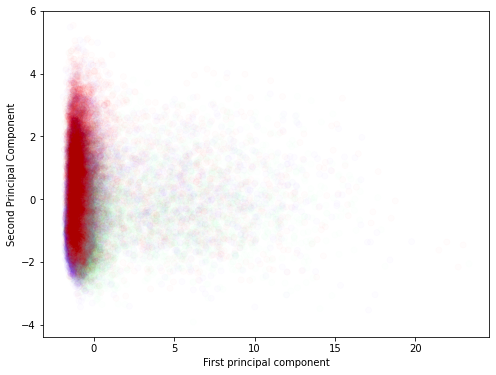

In [8]:
plt.figure(figsize=(8,6))
scatter = plt.scatter(x_pca[:,0],x_pca[:,1],c=label,cmap='rainbow',alpha=0.01)
plt.xlabel('First principal component')
plt.ylabel('Second Principal Component')
# plt.legend(handles=scatter.legend_elements()[0], labels=["A549","GM12878","K562"])

<AxesSubplot:xlabel='first component', ylabel='second component'>

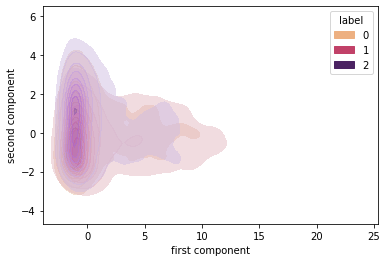

In [9]:
import seaborn as sns
import pandas as pd
df = pd.DataFrame({"first component":x_pca[:,0], "second component":x_pca[:,1], "label":label})
sns.kdeplot(data=df, x="first component", y="second component", hue="label", fill=True, palette="flare", alpha=0.5)

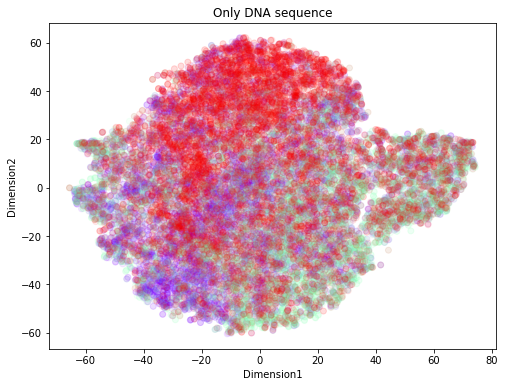

In [10]:
import numpy as np
from sklearn.manifold import TSNE
X_embedded = TSNE(n_components=2, init="pca").fit_transform(temp)
plt.figure(figsize=(8,6))
plt.scatter(X_embedded[:,0],X_embedded[:,1],c=label,cmap='rainbow', alpha=0.07)
plt.xlabel('Dimension1')
plt.ylabel('Dimension2')
# plt.title('DNA sequences and methlylation')
plt.title('Only DNA sequence')
plt.savefig("../../Desktop/Dna2D.png")

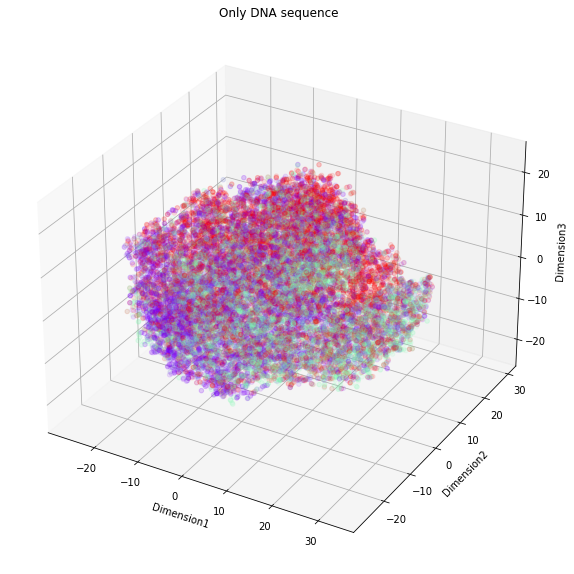

In [11]:
X_embedded = TSNE(n_components=3, init="pca").fit_transform(temp)
ax = plt.figure(figsize=(16,10)).gca(projection='3d')
ax.scatter(
    xs=X_embedded[:,0], 
    ys=X_embedded[:,1], 
    zs=X_embedded[:,2], 
    c=label, 
    cmap='rainbow',
    alpha=0.1
)
ax.set_xlabel('Dimension1')
ax.set_ylabel('Dimension2')
ax.set_zlabel('Dimension3')
# plt.title('DNA sequences and methlylation')
plt.title('Only DNA sequence')
plt.savefig("../../Desktop/Dna3D.png")
plt.show()

<AxesSubplot:xlabel='first component', ylabel='second component'>

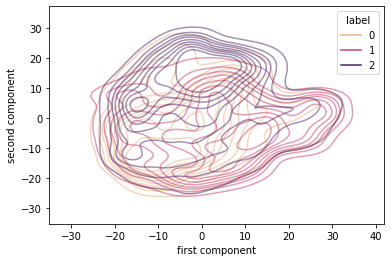

In [12]:
df = pd.DataFrame({"first component":X_embedded[:,0], "second component":X_embedded[:,1], "label":label})
sns.kdeplot(data=df, x="first component", y="second component", hue="label", palette="flare", alpha=0.5)